<h2>Building the Classifier</h2>

In [1]:
import tensorflow as tf
import cv2 as cv
import os
import random
import numpy as np
import pydot

from matplotlib import pyplot as plt

<h2>1. Defining Classifier</h2>

In [2]:
CLASSES = 4
model = tf.keras.models.Sequential([
    
    tf.keras.layers.Conv2D(16, kernel_size=3, activation='relu', input_shape=(224, 224, 1)),
    tf.keras.layers.AveragePooling2D(2,2),
    
    tf.keras.layers.Conv2D(32, kernel_size=3, activation = 'relu'),
    tf.keras.layers.AveragePooling2D(2,2),
    
    tf.keras.layers.Conv2D(64, kernel_size=3, activation = 'relu'),
    tf.keras.layers.AveragePooling2D(2,2),
    
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation = 'relu'),
    
    tf.keras.layers.Dense(CLASSES, activation='softmax')
    
])

C:\Users\dzaki\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [3]:
def build_classifier(inputs):

    x = tf.keras.layers.Conv2D(16, kernel_size=3, activation='relu', input_shape=(input_size, input_size, 1))(inputs)
    x = tf.keras.layers.AveragePooling2D(2,2)(x)

    x = tf.keras.layers.Conv2D(32, kernel_size=3, activation = 'relu')(x)
    x = tf.keras.layers.AveragePooling2D(2,2)(x)

    x = tf.keras.layers.Conv2D(64, kernel_size=3, activation = 'relu')(x)
    x = tf.keras.layers.AveragePooling2D(2,2)(x)
    
    x = tf.keras.layers.Flatten()(inputs)
    x = tf.keras.layers.Dense(64, activation='relu')(x)
    
    x = tf.keras.layers.Dense(CLASSES, activation='softmax')(x)

    return x

<h2>2. Building Regressor</h2>

In [4]:
def build_regressor(inputs):

    x = tf.keras.layers.Conv2D(16, kernel_size=3, activation='relu', input_shape=(input_size, input_size, 1))(inputs)
    x = tf.keras.layers.AveragePooling2D(2,2)(x)

    x = tf.keras.layers.Conv2D(32, kernel_size=3, activation = 'relu')(x)
    x = tf.keras.layers.AveragePooling2D(2,2)(x)

    x = tf.keras.layers.Conv2D(64, kernel_size=3, activation = 'relu')(x)
    x = tf.keras.layers.AveragePooling2D(2,2)(x)
    
    x = tf.keras.layers.Flatten()(inputs)
    x = tf.keras.layers.Dense(64, activation='relu')(x)
    
    x = tf.keras.layers.Dense(units = '4')(inputs)(x)

    return x

In [5]:
def build_feature_extractor(inputs):

    x = tf.keras.layers.Conv2D(16, kernel_size=3, activation='relu', input_shape=(input_size, input_size, 1))(inputs)
    x = tf.keras.layers.AveragePooling2D(2,2)(x)

    x = tf.keras.layers.Conv2D(32, kernel_size=3, activation = 'relu')(x)
    x = tf.keras.layers.AveragePooling2D(2,2)(x)

    x = tf.keras.layers.Conv2D(64, kernel_size=3, activation = 'relu')(x)
    x = tf.keras.layers.AveragePooling2D(2,2)(x)

    return x

def build_model_adaptor(inputs):
    x = tf.keras.layers.Flatten()(inputs)
    x = tf.keras.layers.Dense(64, activation='relu')(x)
    return x

def build_classifier_head(inputs):
    return tf.keras.layers.Dense(CLASSES, activation='softmax', name = 'classifier_head')(inputs)

def build_regressor_head(inputs):
    return tf.keras.layers.Dense(units = '4', name = 'regressor_head')(inputs)

def build_model(inputs):
    
    feature_extractor = build_feature_extractor(inputs)

    model_adaptor = build_model_adaptor(feature_extractor)

    classification_head = build_classifier_head(model_adaptor)

    regressor_head = build_regressor_head(model_adaptor)

    model = tf.keras.Model(inputs = inputs, outputs = [classification_head, regressor_head])

    return model

In [6]:
def list_files(full_data_path = "./obj/", image_ext = '.jpg', split_percentage = [70, 20]):
    
    files = []

    discarded = 0
    masked_instance = 0

    for r, d, f in os.walk(full_data_path):
        for file in f:
            if file.endswith(".txt"):

                # first, let's check if there is more than one object
                with open(full_data_path + "/" + file, 'r') as fp: 
                    lines = fp.readlines()
                    if len(lines) <= 1:
                        discarded += 1
                        continue
                    

                strip = file[0:len(file) - len(".txt")]  
                # secondly, check if the paired image actually exist
                image_path = full_data_path + "/" + strip + image_ext
                if os.path.isfile(image_path):
                    # checking the class. '0' means masked, '1' for unmasked
                    if lines[0][0] == '0':
                        masked_instance += 1
                    files.append(strip)

    size = len(files)   
    print(str(discarded) + " file(s) discarded")
    print(str(size) + " valid case(s)")
    print(str(masked_instance) + " are masked cases")

    random.shuffle(files)

    split_training = int(split_percentage[0] * size / 100)
    split_validation = split_training + int(split_percentage[1] * size / 100)

    return files[0:split_training], files[split_training:split_validation], files[split_validation:]
    
training_files, validation_files, test_files = list_files()

print(str(len(training_files)) + " training files")
print(str(len(validation_files)) + " validation files")
print(str(len(test_files)) + " test files")

1 file(s) discarded
770 valid case(s)
2 are masked cases
539 training files
154 validation files
77 test files


In [7]:
input_size = 244

def format_image(img, box):
    height, width = img.shape 
    max_size = max(height, width)
    r = max_size / input_size
    new_width = int(width / r)
    new_height = int(height / r)
    new_size = (new_width, new_height)
    resized = cv.resize(img, new_size, interpolation= cv.INTER_LINEAR)
    new_image = np.zeros((input_size, input_size), dtype=np.uint8)
    new_image[0:new_height, 0:new_width] = resized

    x, y, w, h = box[0], box[1], box[2], box[3]
    new_box = [int((x - 0.5*w)* width / r), int((y - 0.5*h) * height / r), int(w*width / r), int(h*height / r)]

    return new_image, new_box

<h2>Demonstrasi Cara Melakukan Plotting Boundary Box</h2>

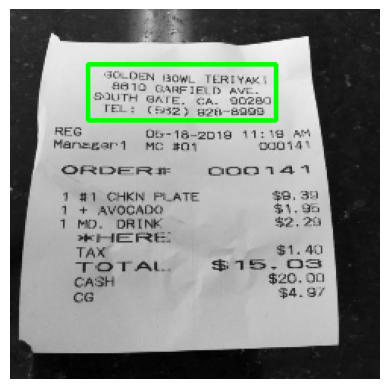

In [8]:
temp_img = cv.imread("./obj/0_jpg.rf.edfc36b893bb5852b605b16fba630ac5.jpg", cv.IMREAD_GRAYSCALE)
temp_box = [0.46796875, 0.2296875, 0.51328125, 0.15703125]

temp_img_formated, box = format_image(temp_img, temp_box)

temp_color_img = cv.cvtColor(temp_img_formated, cv.COLOR_GRAY2RGB)

cv.rectangle(temp_color_img, box, (0, 255, 0), 2)

plt.imshow(temp_color_img)
plt.axis("off")
plt.show()

<h2>Building Model for Receipt Object Detection</h2>

In [9]:
import os

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' # disabling verbose tf logging

# uncomment the following line if you want to force CPU
# os.environ["CUDA_VISIBLE_DEVICES"] = "-1"

import tensorflow as tf
print(tf.__version__)

2.18.0


In [10]:
line_to_be_read = 0

def data_load(files, full_data_path = "./obj/", image_ext = ".jpg"):
    X = []
    Y = []

    for file in files:
        img = cv.imread(os.path.join(full_data_path, file + image_ext), cv.IMREAD_GRAYSCALE)

        k = 1

        with open(full_data_path + "/" + file + ".txt", 'r') as fp: 
            line = fp.readlines()[line_to_be_read]
            if line[0] == '0':
                k = 0

            box = np.array(line[1:].split(), dtype=float)

        img, box = format_image(img, box)
        img = img.astype(float) / 255.
        box = np.asarray(box, dtype=float) / input_size
        label = np.append(box, k)

        X.append(img)
        Y.append(label)

    X = np.array(X)
    
    X = np.expand_dims(X, axis=3)

    X = tf.convert_to_tensor(X, dtype=tf.float32)

    Y = tf.convert_to_tensor(Y, dtype=tf.float32)

    result = tf.data.Dataset.from_tensor_slices((X, Y))

    return result

<u><h3>Keterangan Tambahan</h3></u>
<p>
    line_to_be_read :
    <ul>
        <li>0 = Seluruh Struk Belanja</li>
        <li>1 = Info Toko</li>
        <li>2 = Daftar Belanjaan</li>
        <li>3 = Total</li>
    </ul>
</p>

In [11]:
raw_train_ds = data_load(training_files)

In [12]:
raw_validation_ds = data_load(validation_files)

In [13]:
raw_test_ds = data_load(test_files)

In [14]:
CLASSES = 2

def format_instance(image, label):
    return image, (tf.one_hot(int(label[4]), CLASSES), [label[0], label[1], label[2], label[3]])

In [15]:
BATCH_SIZE = 32

# see https://www.tensorflow.org/guide/data_performance

def tune_training_ds(dataset):
    dataset = dataset.map(format_instance, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.shuffle(1024, reshuffle_each_iteration=True)
    dataset = dataset.repeat() # The dataset be repeated indefinitely.
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    return dataset

In [16]:
train_ds = tune_training_ds(raw_train_ds)

In [17]:
def tune_validation_ds(dataset):
    dataset = dataset.map(format_instance, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(len(validation_files) // 4)
    dataset = dataset.repeat()
    return dataset

In [18]:
validation_ds = tune_validation_ds(raw_validation_ds)

<h2>Inspect Dataset</h2>

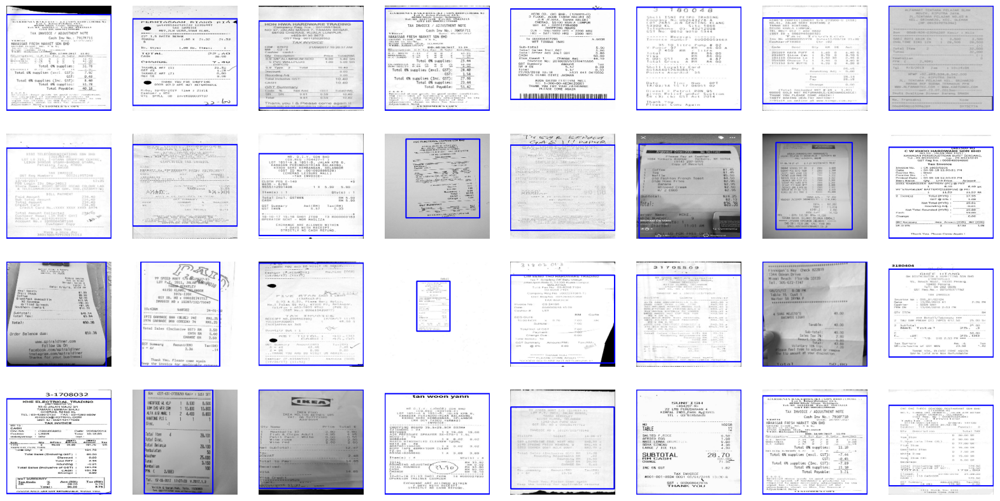

In [19]:
plt.figure(figsize=(20, 10))
for images, labels in train_ds.take(1):
    for i in range(BATCH_SIZE):
        ax = plt.subplot(4, BATCH_SIZE//4, i + 1)
        label = labels[0][i]
        box = (labels[1][i] * input_size)
        box = tf.cast(box, tf.int32)

        image = images[i].numpy().astype("float") * 255.0
        image = image.astype(np.uint8)
        image_color = cv.cvtColor(image, cv.COLOR_GRAY2RGB)

        color = (0, 0, 255)
        if label[0] > 0:
            color = (0, 255, 0)

        cv.rectangle(image_color, box.numpy(), color, 2)

        plt.imshow(image_color)
        plt.axis("off")

<h2>The Model</h2>

In [20]:
DROPOUT_FACTOR = 0.5

def build_feature_extractor(inputs):
    x = tf.keras.Input(shape=(input_size, input_size, 1,))
    x = tf.keras.layers.Conv2D(16, kernel_size=3, activation='relu')(inputs)
    x = tf.keras.layers.AveragePooling2D(2,2)(x)

    x = tf.keras.layers.Conv2D(32, kernel_size=3, activation = 'relu')(x)
    x = tf.keras.layers.AveragePooling2D(2,2)(x)

    x = tf.keras.layers.Conv2D(64, kernel_size=3, activation = 'relu')(x)
    x = tf.keras.layers.Dropout(DROPOUT_FACTOR)(x)
    x = tf.keras.layers.AveragePooling2D(2,2)(x)

    return x

def build_model_adaptor(inputs):
  x = tf.keras.layers.Flatten()(inputs)
  x = tf.keras.layers.Dense(64, activation='relu')(x)
  return x

def build_classifier_head(inputs):
  return tf.keras.layers.Dense(CLASSES, activation='softmax', name = 'classifier_head')(inputs)

def build_regressor_head(inputs):
    #return tf.keras.layers.Dense(units = '4', name = 'regressor_head')(inputs)
    return tf.keras.layers.Dense(units=4, name='regressor_head')(inputs)

def build_model(inputs):
    
    feature_extractor = build_feature_extractor(inputs)

    model_adaptor = build_model_adaptor(feature_extractor)

    classification_head = build_classifier_head(model_adaptor)

    regressor_head = build_regressor_head(model_adaptor)

    model = tf.keras.Model(inputs = inputs, outputs = [classification_head, regressor_head])

    model.compile(optimizer=tf.keras.optimizers.Adam(), 
              loss = {'classifier_head' : 'categorical_crossentropy', 'regressor_head' : 'mse' }, 
              metrics = {'classifier_head' : 'accuracy', 'regressor_head' :  'mse'})

    return model

In [21]:
model = build_model(tf.keras.layers.Input(shape=(input_size, input_size, 1,)))

model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)    │ (None, 244, 244, 1)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_3 (Conv2D)             │ (None, 242, 242, 16)      │             160 │ input_layer_1[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ average_pooling2d_3           │ (None, 121, 121, 16)      │               0 │ conv2d_3[0][0]             │
│ (AveragePooling2D)            │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_4 (Conv2D)             │ (None, 119, 119, 32)      │           4,640 │ average_pooling2d_3[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ average_pooling2d_4           │ (None, 59, 59, 32)        │               0 │ conv2d_4[0][0]             │
│ (AveragePooling2D)            │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_5 (Conv2D)             │ (None, 57, 57, 64)        │          18,496 │ average_pooling2d_4[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout (Dropout)             │ (None, 57, 57, 64)        │               0 │ conv2d_5[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ average_pooling2d_5           │ (None, 28, 28, 64)        │               0 │ dropout[0][0]              │
│ (AveragePooling2D)            │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ flatten_1 (Flatten)           │ (None, 50176)             │               0 │ average_pooling2d_5[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_2 (Dense)               │ (None, 64)                │       3,211,328 │ flatten_1[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ classifier_head (Dense)       │ (None, 2)                 │             130 │ dense_2[0][0]              │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ regressor_head (Dense)        │ (None, 4)                 │             260 │ dense_2[0][0]              │
└───────────────────────────────┴───────────────────────────┴─────────────────┴────────────────────────────┘

 Total params: 3,235,014 (12.34 MB)

 Trainable params: 3,235,014 (12.34 MB)

 Non-trainable params: 0 (0.00 B)

In [22]:
#!pip install pydot
import pydot

<h2>Model Training</h2>

In [23]:
EPOCHS = 100

history = model.fit(train_ds,
                    steps_per_epoch=(len(training_files) // BATCH_SIZE),
                    validation_data=validation_ds, validation_steps=1,
                    epochs=EPOCHS,
                    verbose=1)


Epoch 1/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 7s 342ms/step - classifier_head_accuracy: 0.7967 - classifier_head_loss: 0.2183 - loss: 0.4550 - regressor_head_loss: 0.2366 - regressor_head_mse: 0.2366 - val_classifier_head_accuracy: 1.0000 - val_classifier_head_loss: 0.0107 - val_loss: 0.0425 - val_regressor_head_loss: 0.0318 - val_regressor_head_mse: 0.0318
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 4s 273ms/step - classifier_head_accuracy: 0.9973 - classifier_head_loss: 0.0235 - loss: 0.0615 - regressor_head_loss: 0.0380 - regressor_head_mse: 0.0380 - val_classifier_head_accuracy: 1.0000 - val_classifier_head_loss: 0.0077 - val_loss: 0.0350 - val_regressor_head_loss: 0.0273 - val_regressor_head_mse: 0.0273
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 4s 273ms/step - classifier_head_accuracy: 0.9964 - classifier_head_loss: 0.0266 - loss: 0.0545 - regressor_head_loss: 0.0279 - regressor_head_mse: 0.0279 - val_classifier_head_accuracy: 1.0000 - val_classifier_head_loss: 0.0043 - val_loss: 0.0303 - val_re

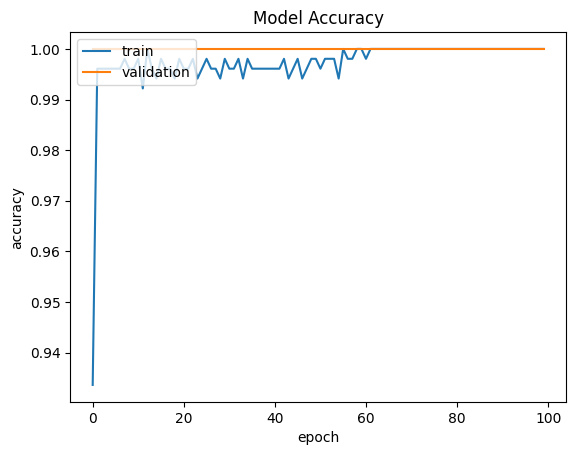

In [24]:
plt.plot(history.history['classifier_head_accuracy'])
plt.plot(history.history['val_classifier_head_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

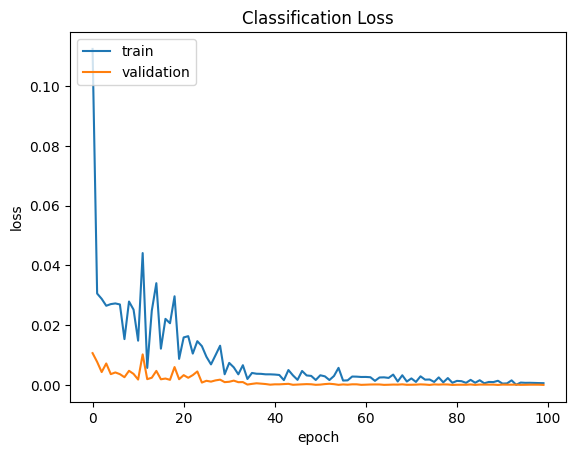

In [25]:
plt.plot(history.history['classifier_head_loss'])
plt.plot(history.history['val_classifier_head_loss'])
plt.title('Classification Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

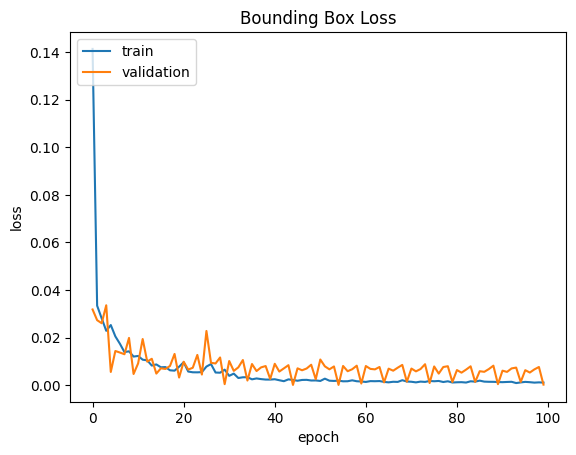

In [26]:
plt.plot(history.history['regressor_head_loss'])
plt.plot(history.history['val_regressor_head_loss'])
plt.title('Bounding Box Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

<h2>Evaluation</h2>

In [27]:
# adapted from: https://pyimagesearch.com/2016/11/07/intersection-over-union-iou-for-object-detection/
def intersection_over_union(boxA, boxB):
	xA = max(boxA[0], boxB[0])
	yA = max(boxA[1], boxB[1])
	xB = min(boxA[0] + boxA[2], boxB[0] + boxB[2])
	yB = min(boxA[1] + boxA[3], boxB[1] + boxB[3])
	interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
	boxAArea = (boxA[2] + 1) * (boxA[3] + 1)
	boxBArea = (boxB[2] + 1) * (boxB[3] + 1)
	iou = interArea / float(boxAArea + boxBArea - interArea)
	return iou

In [28]:
def tune_test_ds(dataset):
    dataset = dataset.map(format_instance, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(1) 
    dataset = dataset.repeat()
    return dataset

test_ds = tune_test_ds(raw_test_ds)

20


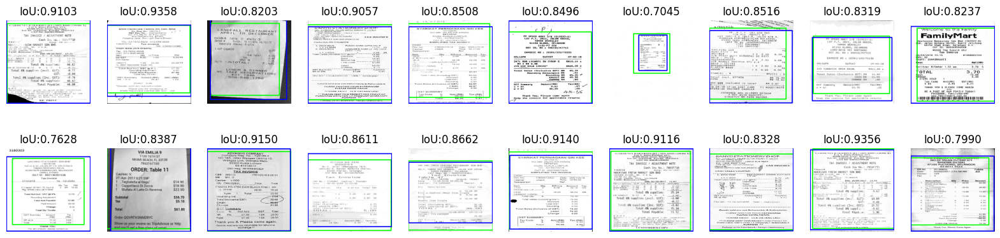

In [29]:
plt.figure(figsize=(20, 10))

test_list = list(test_ds.take(20).as_numpy_iterator())

print(len(test_list))

image, labels = test_list[0]

for i in range(len(test_list)):

    ax = plt.subplot(4, 10, i + 1)
    image, labels = test_list[i]

    predictions = model(image)

    predicted_box = predictions[1][0] * input_size
    predicted_box = tf.cast(predicted_box, tf.int32)

    predicted_label = predictions[0][0]

    image = image[0]

    actual_label = labels[0][0]
    actual_box = labels[1][0] * input_size
    actual_box = tf.cast(actual_box, tf.int32)

    image = image.astype("float") * 255.0
    image = image.astype(np.uint8)
    image_color = cv.cvtColor(image, cv.COLOR_GRAY2RGB)

    color = (255, 0, 0)
    # print box red if predicted and actual label do not match
    if (predicted_label[0] > 0.5 and actual_label[0] > 0) or (predicted_label[0] < 0.5 and actual_label[0] == 0):
        color = (0, 255, 0)

    cv.rectangle(image_color, predicted_box.numpy(), color, 2)
    cv.rectangle(image_color, actual_box.numpy(), (0, 0, 255), 2)

    IoU = intersection_over_union(predicted_box.numpy(), actual_box.numpy())

    plt.title("IoU:" + format(IoU, '.4f'))
    plt.imshow(image_color)
    plt.axis("off")

<h2>Test Deployment</h2>

In [30]:
import re
from statistics import mean

def path_norm(image_path):
    image_path = re.sub(r'\\','/',image_path)
    return image_path

def obj_detect(image_path):
    image_path = path_norm(image_path)
    img = cv.imread(image_path, cv.IMREAD_GRAYSCALE)

    #preprocess image
    height, width = img.shape 
    max_size = max(height, width)
    r = max_size / input_size
    new_width = int(width / r)
    new_height = int(height / r)
    new_size = (new_width, new_height)
    resized = cv.resize(img, new_size, interpolation= cv.INTER_LINEAR)
    new_image = np.zeros((input_size, input_size), dtype=np.uint8)
    new_image[0:new_height, 0:new_width] = resized

    #second preprocessing
    X = [] 
    new_image = new_image.astype(float) / 255.

    X.append(new_image)

    #third preprocessing
    X = np.array(X)
    
    X = np.expand_dims(X, axis=3)

    X = tf.convert_to_tensor(X, dtype=tf.float32)

    result = X
    #fourth preprocessing 
    predictions = model(result)

    predicted_box = abs(predictions[1][0] * max_size)
    
    predicted_box = tf.cast(predicted_box, tf.int32)
    
    temp_color_img = cv.cvtColor(img, cv.COLOR_GRAY2RGB)

    temp_color_img = cv.rectangle(temp_color_img, predicted_box.numpy(), color, 2)

    plt.imshow(temp_color_img)
    plt.axis("off")
    plt.show()
    
    return(predicted_box)

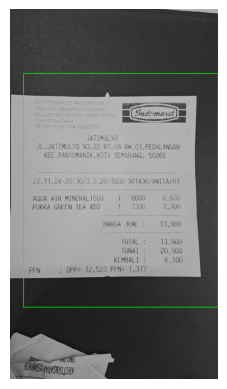

<tf.Tensor: shape=(4,), dtype=int32, numpy=array([  58,  278, 1263, 1011])>

In [31]:
obj_detect(r'C:\Users\dzaki\Downloads\test_indomaret.jpeg')

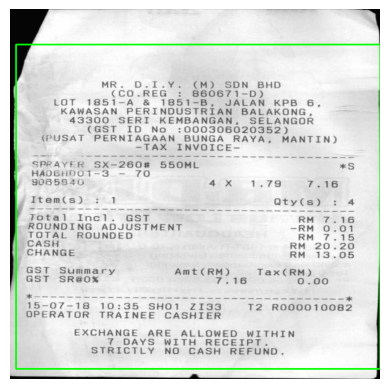

<tf.Tensor: shape=(4,), dtype=int32, numpy=array([ 10,  61, 661, 562])>

In [32]:
obj_detect(r'C:\Users\dzaki\Downloads\test_indomaret2.jpg')

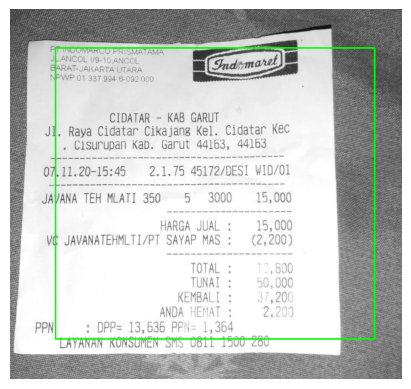

<tf.Tensor: shape=(4,), dtype=int32, numpy=array([ 82,  70, 579, 528])>

In [33]:
obj_detect(r'C:\Users\dzaki\Downloads\test_indomaret3.jpg')

<h2>Building Model for Store Information</h2>

In [34]:
line_to_be_read = 1
raw_train_ds_1 = data_load(training_files)
raw_validation_ds_1 = data_load(validation_files)
raw_test_ds_1 = data_load(test_files)

In [35]:
train_ds_1 = tune_training_ds(raw_train_ds_1)
validation_ds_1 = tune_validation_ds(raw_validation_ds_1)

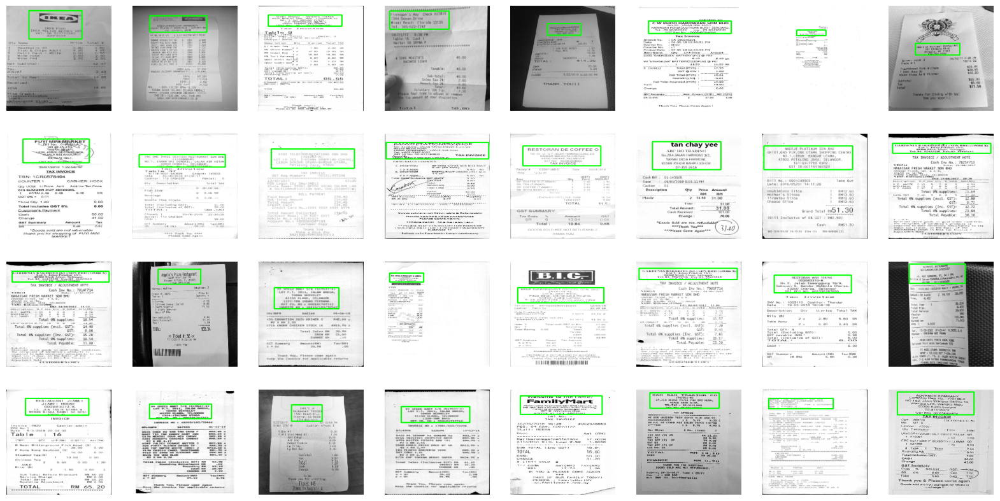

In [36]:
plt.figure(figsize=(20, 10))
for images, labels in train_ds_1.take(1):
    for i in range(BATCH_SIZE):
        ax = plt.subplot(4, BATCH_SIZE//4, i + 1)
        label = labels[0][i]
        box = (labels[1][i] * input_size)
        box = tf.cast(box, tf.int32)

        image = images[i].numpy().astype("float") * 255.0
        image = image.astype(np.uint8)
        image_color = cv.cvtColor(image, cv.COLOR_GRAY2RGB)

        color = (0, 0, 255)
        if label[0] > 0:
            color = (0, 255, 0)

        cv.rectangle(image_color, box.numpy(), color, 2)

        plt.imshow(image_color)
        plt.axis("off")

In [37]:
model_1 = build_model(tf.keras.layers.Input(shape=(input_size, input_size, 1,)))

model_1.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)    │ (None, 244, 244, 1)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_6 (Conv2D)             │ (None, 242, 242, 16)      │             160 │ input_layer_3[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ average_pooling2d_6           │ (None, 121, 121, 16)      │               0 │ conv2d_6[0][0]             │
│ (AveragePooling2D)            │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_7 (Conv2D)             │ (None, 119, 119, 32)      │           4,640 │ average_pooling2d_6[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ average_pooling2d_7           │ (None, 59, 59, 32)        │               0 │ conv2d_7[0][0]             │
│ (AveragePooling2D)            │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_8 (Conv2D)             │ (None, 57, 57, 64)        │          18,496 │ average_pooling2d_7[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout_1 (Dropout)           │ (None, 57, 57, 64)        │               0 │ conv2d_8[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ average_pooling2d_8           │ (None, 28, 28, 64)        │               0 │ dropout_1[0][0]            │
│ (AveragePooling2D)            │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ flatten_2 (Flatten)           │ (None, 50176)             │               0 │ average_pooling2d_8[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_3 (Dense)               │ (None, 64)                │       3,211,328 │ flatten_2[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ classifier_head (Dense)       │ (None, 2)                 │             130 │ dense_3[0][0]              │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ regressor_head (Dense)        │ (None, 4)                 │             260 │ dense_3[0][0]              │
└───────────────────────────────┴───────────────────────────┴─────────────────┴────────────────────────────┘

 Total params: 3,235,014 (12.34 MB)

 Trainable params: 3,235,014 (12.34 MB)

 Non-trainable params: 0 (0.00 B)

In [38]:
EPOCHS = 100

history = model_1.fit(train_ds_1,
                    steps_per_epoch=(len(training_files) // BATCH_SIZE),
                    validation_data=validation_ds_1, validation_steps=1,
                    epochs=EPOCHS,
                    verbose=1)


Epoch 1/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 6s 267ms/step - classifier_head_accuracy: 0.8661 - classifier_head_loss: 0.3533 - loss: 1.8332 - regressor_head_loss: 1.4799 - regressor_head_mse: 1.4799 - val_classifier_head_accuracy: 1.0000 - val_classifier_head_loss: 0.0147 - val_loss: 0.0458 - val_regressor_head_loss: 0.0311 - val_regressor_head_mse: 0.0311
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 4s 248ms/step - classifier_head_accuracy: 0.9869 - classifier_head_loss: 0.0774 - loss: 0.1068 - regressor_head_loss: 0.0294 - regressor_head_mse: 0.0294 - val_classifier_head_accuracy: 1.0000 - val_classifier_head_loss: 0.0373 - val_loss: 0.0593 - val_regressor_head_loss: 0.0219 - val_regressor_head_mse: 0.0219
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 4s 274ms/step - classifier_head_accuracy: 0.9897 - classifier_head_loss: 0.0683 - loss: 0.0888 - regressor_head_loss: 0.0205 - regressor_head_mse: 0.0205 - val_classifier_head_accuracy: 1.0000 - val_classifier_head_loss: 0.0105 - val_loss: 0.0268 - val_re

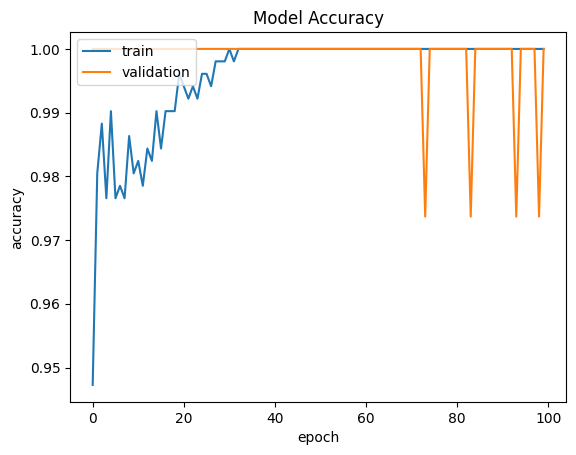

In [39]:
plt.plot(history.history['classifier_head_accuracy'])
plt.plot(history.history['val_classifier_head_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

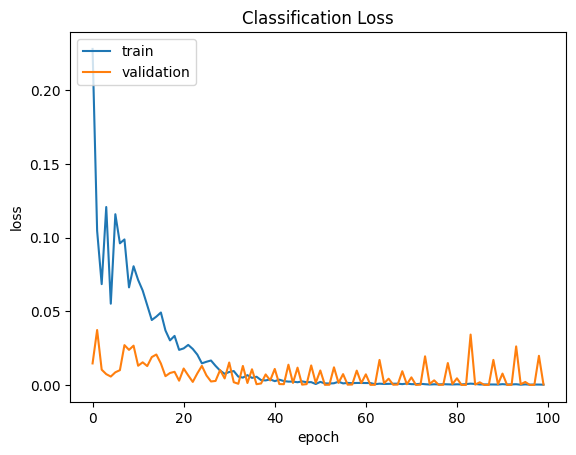

In [40]:
plt.plot(history.history['classifier_head_loss'])
plt.plot(history.history['val_classifier_head_loss'])
plt.title('Classification Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

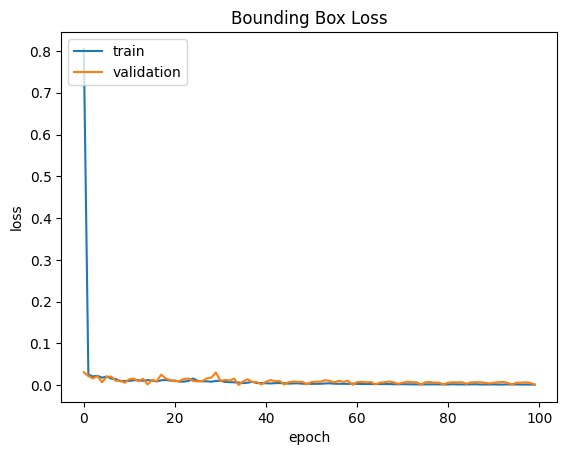

In [41]:
plt.plot(history.history['regressor_head_loss'])
plt.plot(history.history['val_regressor_head_loss'])
plt.title('Bounding Box Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

20


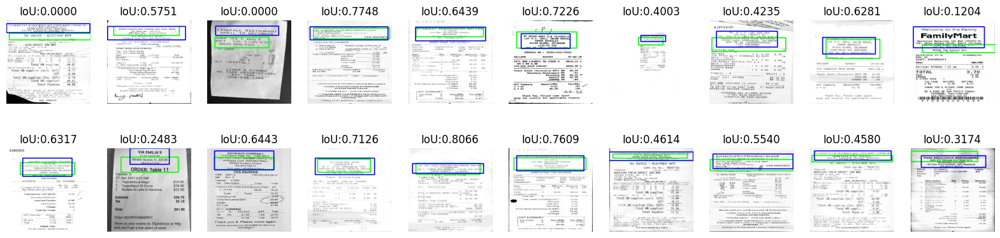

In [42]:
test_ds_1 = tune_test_ds(raw_test_ds_1) #

plt.figure(figsize=(20, 10))

test_list_1 = list(test_ds_1.take(20).as_numpy_iterator()) #

print(len(test_list_1)) #

image, labels = test_list_1[0] #

for i in range(len(test_list_1)):

    ax = plt.subplot(4, 10, i + 1)
    image, labels = test_list_1[i] #

    predictions = model_1(image) #

    predicted_box = abs(predictions[1][0] * input_size)
    predicted_box = tf.cast(predicted_box, tf.int32)

    predicted_label = predictions[0][0]

    image = image[0]

    actual_label = labels[0][0]
    actual_box = labels[1][0] * input_size
    actual_box = tf.cast(actual_box, tf.int32)

    image = image.astype("float") * 255.0
    image = image.astype(np.uint8)
    image_color = cv.cvtColor(image, cv.COLOR_GRAY2RGB)

    color = (255, 0, 0)
    # print box red if predicted and actual label do not match
    if (predicted_label[0] > 0.5 and actual_label[0] > 0) or (predicted_label[0] < 0.5 and actual_label[0] == 0):
        color = (0, 255, 0)

    cv.rectangle(image_color, predicted_box.numpy(), color, 2)
    cv.rectangle(image_color, actual_box.numpy(), (0, 0, 255), 2)

    IoU = intersection_over_union(predicted_box.numpy(), actual_box.numpy())

    plt.title("IoU:" + format(IoU, '.4f'))
    plt.imshow(image_color)
    plt.axis("off")

In [43]:
def obj_detect_1(image_path):
    image_path = path_norm(image_path)
    img = cv.imread(image_path, cv.IMREAD_GRAYSCALE)

    #preprocess image
    height, width = img.shape 
    max_size = max(height, width)
    r = max_size / input_size
    new_width = int(width / r)
    new_height = int(height / r)
    new_size = (new_width, new_height)
    resized = cv.resize(img, new_size, interpolation= cv.INTER_LINEAR)
    new_image = np.zeros((input_size, input_size), dtype=np.uint8)
    new_image[0:new_height, 0:new_width] = resized

    #second preprocessing
    X = [] 
    new_image = new_image.astype(float) / 255.

    X.append(new_image)

    #third preprocessing
    X = np.array(X)
    
    X = np.expand_dims(X, axis=3)

    X = tf.convert_to_tensor(X, dtype=tf.float32)

    result = X
    #fourth preprocessing 
    predictions = model_1(result)

    predicted_box = abs(predictions[1][0] * max_size)
    
    predicted_box = tf.cast(predicted_box, tf.int32)
    
    temp_color_img = cv.cvtColor(img, cv.COLOR_GRAY2RGB)

    temp_color_img = cv.rectangle(temp_color_img, predicted_box.numpy(), color, 2)

    plt.imshow(temp_color_img)
    plt.axis("off")
    plt.show()
    
    return(predicted_box)

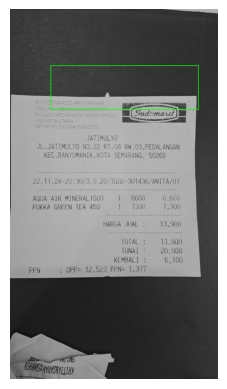

<tf.Tensor: shape=(4,), dtype=int32, numpy=array([176, 244, 639, 191])>

In [44]:
obj_detect_1(r'C:\Users\dzaki\Downloads\test_indomaret.jpeg')

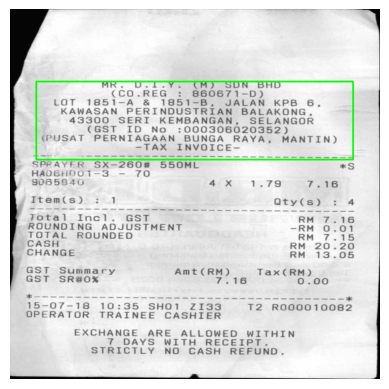

<tf.Tensor: shape=(4,), dtype=int32, numpy=array([ 45, 125, 549, 136])>

In [45]:
obj_detect_1(r'C:\Users\dzaki\Downloads\test_indomaret2.jpg')

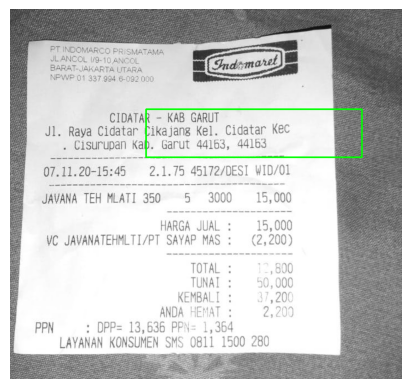

<tf.Tensor: shape=(4,), dtype=int32, numpy=array([246, 181, 392,  88])>

In [46]:
obj_detect_1(r'C:\Users\dzaki\Downloads\test_indomaret3.jpg')

<h2>Building Model for Purchased Items</h2>

In [47]:
line_to_be_read = 2
raw_train_ds_2 = data_load(training_files)
raw_validation_ds_2 = data_load(validation_files)
raw_test_ds_2 = data_load(test_files)

In [48]:
train_ds_2 = tune_training_ds(raw_train_ds_2)
validation_ds_2 = tune_validation_ds(raw_validation_ds_2)

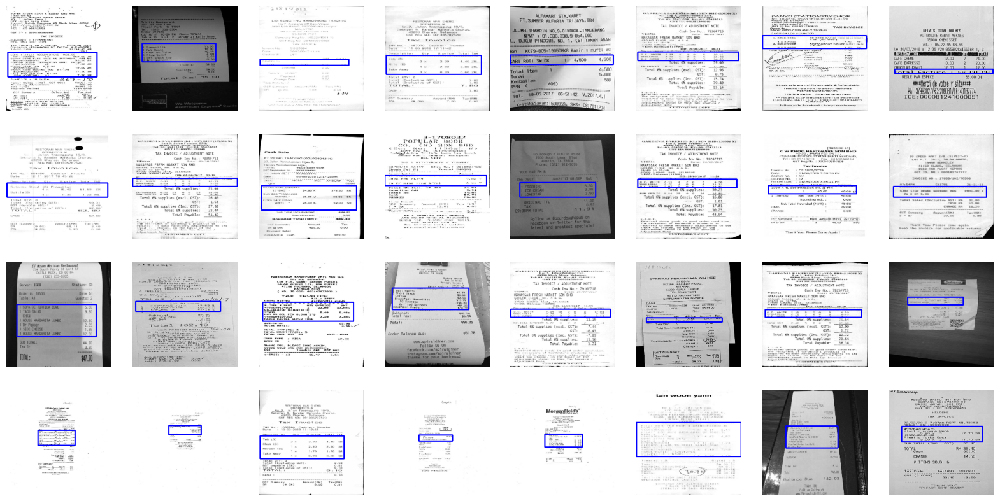

In [49]:
plt.figure(figsize=(20, 10))
for images, labels in train_ds_2.take(1): #
    for i in range(BATCH_SIZE):
        ax = plt.subplot(4, BATCH_SIZE//4, i + 1)
        label = labels[0][i]
        box = (labels[1][i] * input_size)
        box = tf.cast(box, tf.int32)

        image = images[i].numpy().astype("float") * 255.0
        image = image.astype(np.uint8)
        image_color = cv.cvtColor(image, cv.COLOR_GRAY2RGB)

        color = (0, 0, 255)
        if label[0] > 0:
            color = (0, 255, 0)

        cv.rectangle(image_color, box.numpy(), color, 2)

        plt.imshow(image_color)
        plt.axis("off")

In [50]:
model_2 = build_model(tf.keras.layers.Input(shape=(input_size, input_size, 1,)))

model_2.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)    │ (None, 244, 244, 1)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_9 (Conv2D)             │ (None, 242, 242, 16)      │             160 │ input_layer_5[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ average_pooling2d_9           │ (None, 121, 121, 16)      │               0 │ conv2d_9[0][0]             │
│ (AveragePooling2D)            │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_10 (Conv2D)            │ (None, 119, 119, 32)      │           4,640 │ average_pooling2d_9[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ average_pooling2d_10          │ (None, 59, 59, 32)        │               0 │ conv2d_10[0][0]            │
│ (AveragePooling2D)            │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_11 (Conv2D)            │ (None, 57, 57, 64)        │          18,496 │ average_pooling2d_10[0][0] │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout_2 (Dropout)           │ (None, 57, 57, 64)        │               0 │ conv2d_11[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ average_pooling2d_11          │ (None, 28, 28, 64)        │               0 │ dropout_2[0][0]            │
│ (AveragePooling2D)            │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ flatten_3 (Flatten)           │ (None, 50176)             │               0 │ average_pooling2d_11[0][0] │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_4 (Dense)               │ (None, 64)                │       3,211,328 │ flatten_3[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ classifier_head (Dense)       │ (None, 2)                 │             130 │ dense_4[0][0]              │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ regressor_head (Dense)        │ (None, 4)                 │             260 │ dense_4[0][0]              │
└───────────────────────────────┴───────────────────────────┴─────────────────┴────────────────────────────┘

 Total params: 3,235,014 (12.34 MB)

 Trainable params: 3,235,014 (12.34 MB)

 Non-trainable params: 0 (0.00 B)

In [51]:
EPOCHS = 100

history = model_2.fit(train_ds_2,
                    steps_per_epoch=(len(training_files) // BATCH_SIZE),
                    validation_data=validation_ds_2, validation_steps=1,
                    epochs=EPOCHS,
                    verbose=1)

Epoch 1/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 6s 260ms/step - classifier_head_accuracy: 0.8446 - classifier_head_loss: 0.2458 - loss: 1.8111 - regressor_head_loss: 1.5653 - regressor_head_mse: 1.5653 - val_classifier_head_accuracy: 1.0000 - val_classifier_head_loss: 0.0394 - val_loss: 0.1023 - val_regressor_head_loss: 0.0629 - val_regressor_head_mse: 0.0629
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 4s 255ms/step - classifier_head_accuracy: 0.9913 - classifier_head_loss: 0.0562 - loss: 0.1094 - regressor_head_loss: 0.0532 - regressor_head_mse: 0.0532 - val_classifier_head_accuracy: 1.0000 - val_classifier_head_loss: 0.0171 - val_loss: 0.0466 - val_regressor_head_loss: 0.0296 - val_regressor_head_mse: 0.0296
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 5s 286ms/step - classifier_head_accuracy: 0.9929 - classifier_head_loss: 0.0477 - loss: 0.0760 - regressor_head_loss: 0.0283 - regressor_head_mse: 0.0283 - val_classifier_head_accuracy: 1.0000 - val_classifier_head_loss: 0.0177 - val_loss: 0.0440 - val_re

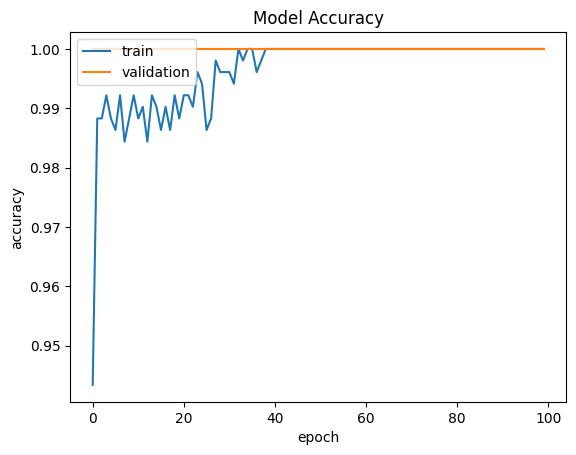

In [52]:
plt.plot(history.history['classifier_head_accuracy'])
plt.plot(history.history['val_classifier_head_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

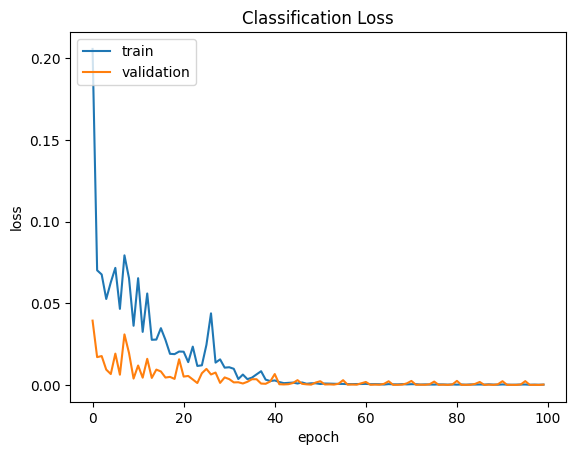

In [53]:
plt.plot(history.history['classifier_head_loss'])
plt.plot(history.history['val_classifier_head_loss'])
plt.title('Classification Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

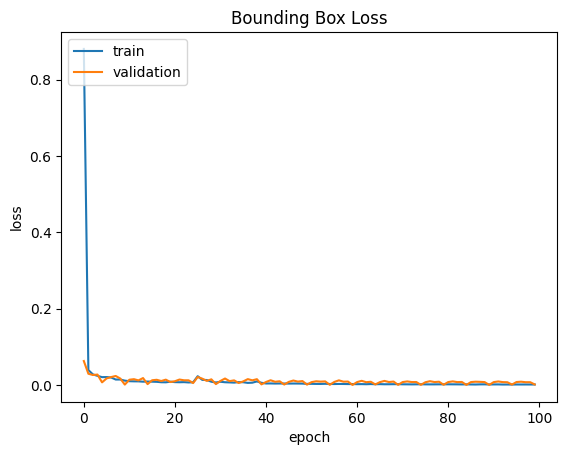

In [54]:
plt.plot(history.history['regressor_head_loss'])
plt.plot(history.history['val_regressor_head_loss'])
plt.title('Bounding Box Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

20


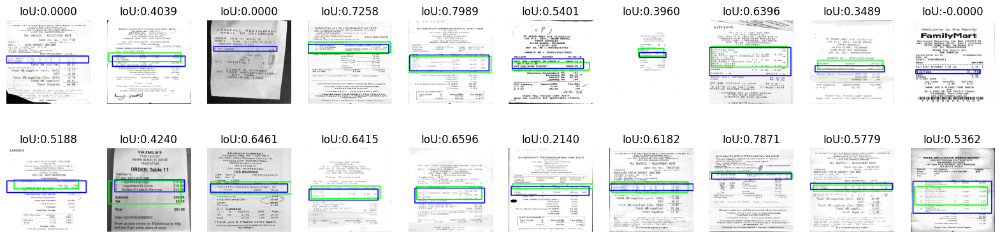

In [55]:
test_ds_2 = tune_test_ds(raw_test_ds_2) #change

plt.figure(figsize=(20, 10))

test_list_2 = list(test_ds_2.take(20).as_numpy_iterator()) #change

print(len(test_list_2)) #change

image, labels = test_list_2[0] #change

for i in range(len(test_list_2)): #change

    ax = plt.subplot(4, 10, i + 1)
    image, labels = test_list_2[i] #change

    predictions = model_2(image) #change

    predicted_box = predictions[1][0] * input_size
    predicted_box = tf.cast(predicted_box, tf.int32)

    predicted_label = predictions[0][0]

    image = image[0]

    actual_label = labels[0][0]
    actual_box = labels[1][0] * input_size
    actual_box = tf.cast(actual_box, tf.int32)

    image = image.astype("float") * 255.0
    image = image.astype(np.uint8)
    image_color = cv.cvtColor(image, cv.COLOR_GRAY2RGB)

    color = (255, 0, 0)
    # print box red if predicted and actual label do not match
    if (predicted_label[0] > 0.5 and actual_label[0] > 0) or (predicted_label[0] < 0.5 and actual_label[0] == 0):
        color = (0, 255, 0)

    cv.rectangle(image_color, predicted_box.numpy(), color, 2)
    cv.rectangle(image_color, actual_box.numpy(), (0, 0, 255), 2)

    IoU = intersection_over_union(predicted_box.numpy(), actual_box.numpy())

    plt.title("IoU:" + format(IoU, '.4f'))
    plt.imshow(image_color)
    plt.axis("off")

In [56]:
def obj_detect_2(image_path): #
    image_path = path_norm(image_path)
    img = cv.imread(image_path, cv.IMREAD_GRAYSCALE)

    #preprocess image
    height, width = img.shape 
    max_size = max(height, width)
    r = max_size / input_size
    new_width = int(width / r)
    new_height = int(height / r)
    new_size = (new_width, new_height)
    resized = cv.resize(img, new_size, interpolation= cv.INTER_LINEAR)
    new_image = np.zeros((input_size, input_size), dtype=np.uint8)
    new_image[0:new_height, 0:new_width] = resized

    #second preprocessing
    X = [] 
    new_image = new_image.astype(float) / 255.

    X.append(new_image)

    #third preprocessing
    X = np.array(X)
    
    X = np.expand_dims(X, axis=3)

    X = tf.convert_to_tensor(X, dtype=tf.float32)

    result = X
    #fourth preprocessing 
    predictions = model_2(result) #change

    predicted_box = abs(predictions[1][0] * max_size)
    
    predicted_box = tf.cast(predicted_box, tf.int32)
    
    temp_color_img = cv.cvtColor(img, cv.COLOR_GRAY2RGB)

    temp_color_img = cv.rectangle(temp_color_img, predicted_box.numpy(), color, 2)

    plt.imshow(temp_color_img)
    plt.axis("off")
    plt.show()
    
    return(predicted_box)

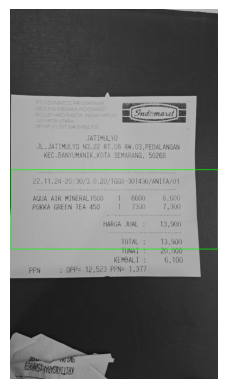

<tf.Tensor: shape=(4,), dtype=int32, numpy=array([   4,  694, 1035,  344])>

In [57]:
obj_detect_2(r'C:\Users\dzaki\Downloads\test_indomaret.jpeg')

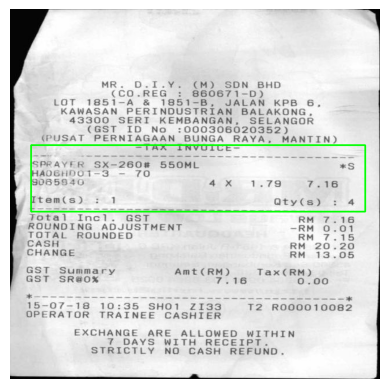

<tf.Tensor: shape=(4,), dtype=int32, numpy=array([ 36, 235, 579, 116])>

In [58]:
obj_detect_2(r'C:\Users\dzaki\Downloads\test_indomaret2.jpg')

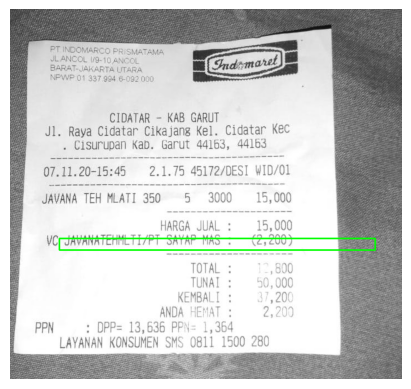

<tf.Tensor: shape=(4,), dtype=int32, numpy=array([ 89, 415, 573,  22])>

In [59]:
obj_detect_2(r'C:\Users\dzaki\Downloads\test_indomaret3.jpg')

<h2>Building Model for Total Price</h2>

In [60]:
def data_load_special(files, full_data_path = "./obj/", image_ext = ".jpg"):
    X = []
    Y = []

    for file in files:
        img = cv.imread(os.path.join(full_data_path, file + image_ext), cv.IMREAD_GRAYSCALE)

        k = 1

        with open(full_data_path + "/" + file + ".txt", 'r') as fp: 
            line = fp.readlines()[-1]
            if line[0] == '0':
                k = 0

            box = np.array(line[1:].split(), dtype=float)

        img, box = format_image(img, box)
        img = img.astype(float) / 255.
        box = np.asarray(box, dtype=float) / input_size
        label = np.append(box, k)

        X.append(img)
        Y.append(label)

    X = np.array(X)
    
    X = np.expand_dims(X, axis=3)

    X = tf.convert_to_tensor(X, dtype=tf.float32)

    Y = tf.convert_to_tensor(Y, dtype=tf.float32)

    result = tf.data.Dataset.from_tensor_slices((X, Y))

    return result

In [61]:
line_to_be_read = 3
raw_train_ds_3 = data_load_special(training_files)
raw_validation_ds_3 = data_load_special(validation_files)
raw_test_ds_3 = data_load_special(test_files)

In [62]:
train_ds_3 = tune_training_ds(raw_train_ds_3)
validation_ds_3 = tune_validation_ds(raw_validation_ds_3)

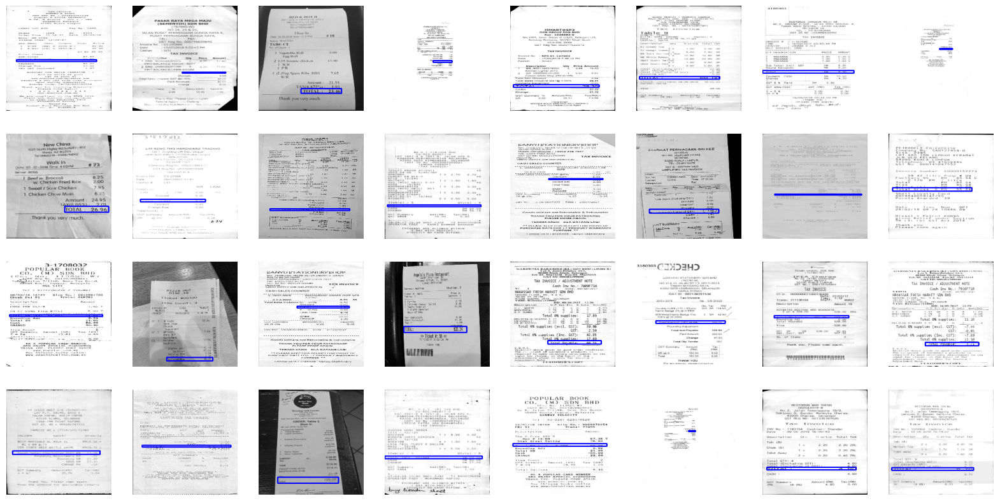

In [63]:
plt.figure(figsize=(20, 10))
for images, labels in train_ds_3.take(1): #change
    for i in range(BATCH_SIZE):
        ax = plt.subplot(4, BATCH_SIZE//4, i + 1)
        label = labels[0][i]
        box = (labels[1][i] * input_size)
        box = tf.cast(box, tf.int32)

        image = images[i].numpy().astype("float") * 255.0
        image = image.astype(np.uint8)
        image_color = cv.cvtColor(image, cv.COLOR_GRAY2RGB)

        color = (0, 0, 255)
        if label[0] > 0:
            color = (0, 255, 0)

        cv.rectangle(image_color, box.numpy(), color, 2)

        plt.imshow(image_color)
        plt.axis("off")

In [64]:
model_3 = build_model(tf.keras.layers.Input(shape=(input_size, input_size, 1,)))

model_3.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)    │ (None, 244, 244, 1)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_12 (Conv2D)            │ (None, 242, 242, 16)      │             160 │ input_layer_7[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ average_pooling2d_12          │ (None, 121, 121, 16)      │               0 │ conv2d_12[0][0]            │
│ (AveragePooling2D)            │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_13 (Conv2D)            │ (None, 119, 119, 32)      │           4,640 │ average_pooling2d_12[0][0] │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ average_pooling2d_13          │ (None, 59, 59, 32)        │               0 │ conv2d_13[0][0]            │
│ (AveragePooling2D)            │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_14 (Conv2D)            │ (None, 57, 57, 64)        │          18,496 │ average_pooling2d_13[0][0] │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout_3 (Dropout)           │ (None, 57, 57, 64)        │               0 │ conv2d_14[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ average_pooling2d_14          │ (None, 28, 28, 64)        │               0 │ dropout_3[0][0]            │
│ (AveragePooling2D)            │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ flatten_4 (Flatten)           │ (None, 50176)             │               0 │ average_pooling2d_14[0][0] │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_5 (Dense)               │ (None, 64)                │       3,211,328 │ flatten_4[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ classifier_head (Dense)       │ (None, 2)                 │             130 │ dense_5[0][0]              │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ regressor_head (Dense)        │ (None, 4)                 │             260 │ dense_5[0][0]              │
└───────────────────────────────┴───────────────────────────┴─────────────────┴────────────────────────────┘

 Total params: 3,235,014 (12.34 MB)

 Trainable params: 3,235,014 (12.34 MB)

 Non-trainable params: 0 (0.00 B)

In [65]:
EPOCHS = 100

history = model_3.fit(train_ds_3, #change
                    steps_per_epoch=(len(training_files) // BATCH_SIZE),
                    validation_data=validation_ds_3, validation_steps=1, #change
                    epochs=EPOCHS,
                    verbose=1)

Epoch 1/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 6s 278ms/step - classifier_head_accuracy: 0.9166 - classifier_head_loss: 0.1700 - loss: 2.2954 - regressor_head_loss: 2.1254 - regressor_head_mse: 2.1254 - val_classifier_head_accuracy: 1.0000 - val_classifier_head_loss: 0.0207 - val_loss: 0.0709 - val_regressor_head_loss: 0.0503 - val_regressor_head_mse: 0.0503
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 4s 276ms/step - classifier_head_accuracy: 0.9994 - classifier_head_loss: 0.0111 - loss: 0.0594 - regressor_head_loss: 0.0483 - regressor_head_mse: 0.0483 - val_classifier_head_accuracy: 1.0000 - val_classifier_head_loss: 0.0033 - val_loss: 0.0331 - val_regressor_head_loss: 0.0298 - val_regressor_head_mse: 0.0298
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 4s 266ms/step - classifier_head_accuracy: 0.9987 - classifier_head_loss: 0.0101 - loss: 0.0439 - regressor_head_loss: 0.0338 - regressor_head_mse: 0.0338 - val_classifier_head_accuracy: 1.0000 - val_classifier_head_loss: 0.0044 - val_loss: 0.0370 - val_re

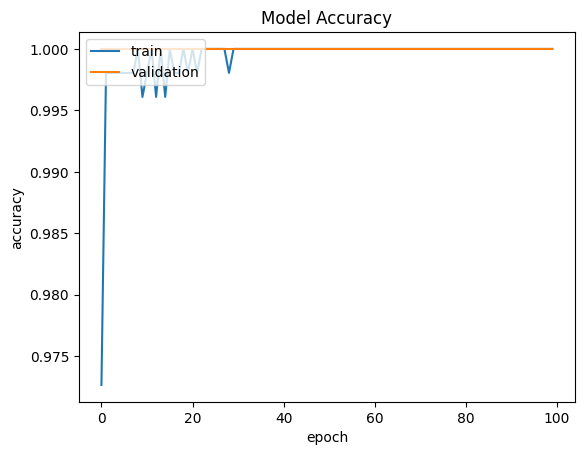

In [66]:
plt.plot(history.history['classifier_head_accuracy'])
plt.plot(history.history['val_classifier_head_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

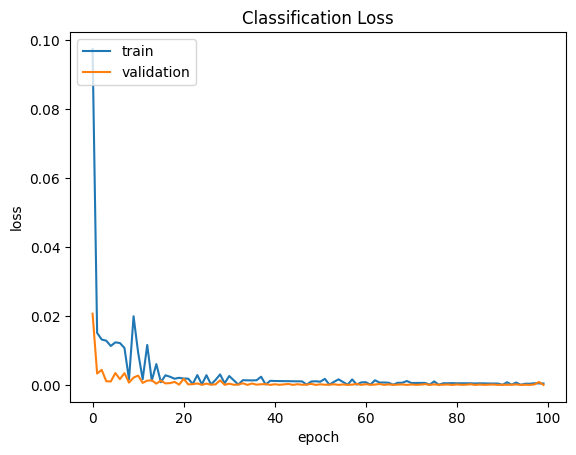

In [67]:
plt.plot(history.history['classifier_head_loss'])
plt.plot(history.history['val_classifier_head_loss'])
plt.title('Classification Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

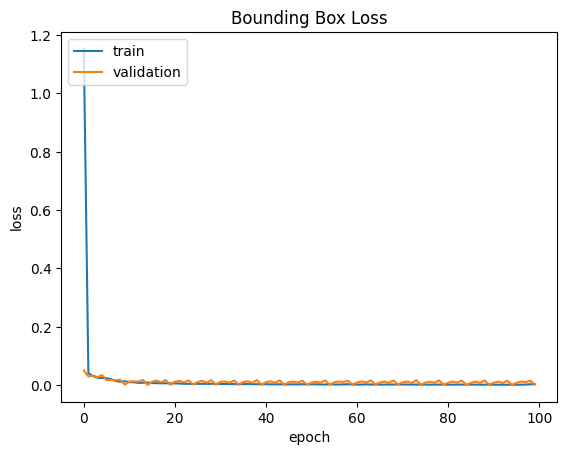

In [68]:
plt.plot(history.history['regressor_head_loss'])
plt.plot(history.history['val_regressor_head_loss'])
plt.title('Bounding Box Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

20


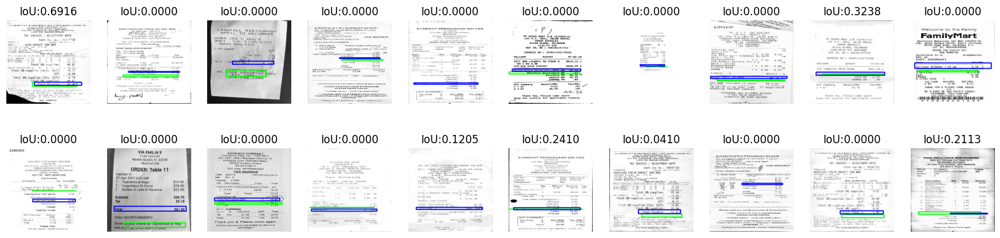

In [69]:
test_ds_3 = tune_test_ds(raw_test_ds_3) #change

plt.figure(figsize=(20, 10))

test_list_3 = list(test_ds_3.take(20).as_numpy_iterator()) #change

print(len(test_list_3)) #change

image, labels = test_list_3[0] #change

for i in range(len(test_list_3)): #change

    ax = plt.subplot(4, 10, i + 1)
    image, labels = test_list_3[i] #change

    predictions = model_3(image) #change

    predicted_box = predictions[1][0] * input_size
    predicted_box = tf.cast(predicted_box, tf.int32)

    predicted_label = predictions[0][0]

    image = image[0]

    actual_label = labels[0][0]
    actual_box = labels[1][0] * input_size
    actual_box = tf.cast(actual_box, tf.int32)

    image = image.astype("float") * 255.0
    image = image.astype(np.uint8)
    image_color = cv.cvtColor(image, cv.COLOR_GRAY2RGB)

    color = (255, 0, 0)
    # print box red if predicted and actual label do not match
    if (predicted_label[0] > 0.5 and actual_label[0] > 0) or (predicted_label[0] < 0.5 and actual_label[0] == 0):
        color = (0, 255, 0)

    cv.rectangle(image_color, predicted_box.numpy(), color, 2)
    cv.rectangle(image_color, actual_box.numpy(), (0, 0, 255), 2)

    IoU = intersection_over_union(predicted_box.numpy(), actual_box.numpy())

    plt.title("IoU:" + format(IoU, '.4f'))
    plt.imshow(image_color)
    plt.axis("off")

<h2>Combining the Model</h2>

In [70]:
def obj_detect_all(image_path): #
    image_path = path_norm(image_path)
    img = cv.imread(image_path, cv.IMREAD_GRAYSCALE)

    #preprocess image
    height, width = img.shape 
    max_size = max(height, width)
    r = max_size / input_size
    new_width = int(width / r)
    new_height = int(height / r)
    new_size = (new_width, new_height)
    resized = cv.resize(img, new_size, interpolation= cv.INTER_LINEAR)
    new_image = np.zeros((input_size, input_size), dtype=np.uint8)
    new_image[0:new_height, 0:new_width] = resized

    #second preprocessing
    X = [] 
    new_image = new_image.astype(float) / 255.

    X.append(new_image)

    #third preprocessing
    X = np.array(X)
    
    X = np.expand_dims(X, axis=3)

    X = tf.convert_to_tensor(X, dtype=tf.float32)

    result = X
    #fourth preprocessing
    predictions = model(result) #change
    predictions1 = model_1(result) #change
    predictions2 = model_2(result) #change
    predictions3 = model_3(result) #change

    predicted_box = abs(predictions[1][0] * max_size)
    predicted_box1 = abs(predictions1[1][0] * max_size)
    predicted_box2 = abs(predictions2[1][0] * max_size)
    predicted_box3 = abs(predictions3[1][0] * max_size)
    
    predicted_box = tf.cast(predicted_box, tf.int32)
    predicted_box1 = tf.cast(predicted_box1, tf.int32)
    predicted_box2 = tf.cast(predicted_box2, tf.int32)
    predicted_box3 = tf.cast(predicted_box3, tf.int32)
    
    temp_color_img = cv.cvtColor(img, cv.COLOR_GRAY2RGB)

    cv.rectangle(temp_color_img, predicted_box.numpy(), (255,255,0), 2) #struk
    cv.rectangle(temp_color_img, predicted_box1.numpy(), (128,0,156), 2) #info toko
    cv.rectangle(temp_color_img, predicted_box2.numpy(), (255,0,0), 2) #item belanja
    cv.rectangle(temp_color_img, predicted_box3.numpy(), (0,56,56), 2) #total

    plt.imshow(temp_color_img)
    plt.axis("off")
    plt.show()
    
    return(predicted_box)

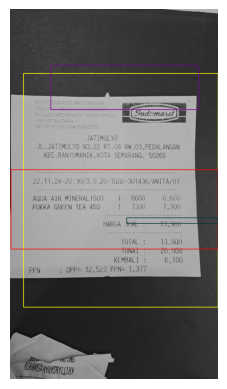

<tf.Tensor: shape=(4,), dtype=int32, numpy=array([  58,  278, 1263, 1011])>

In [71]:
obj_detect_all(r'C:\Users\dzaki\Downloads\test_indomaret.jpeg')

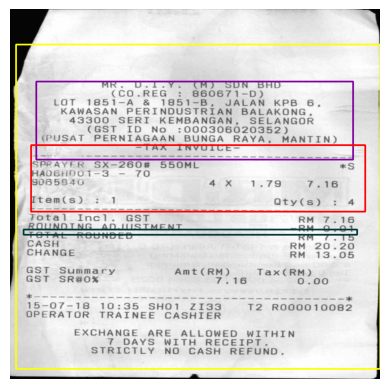

<tf.Tensor: shape=(4,), dtype=int32, numpy=array([ 10,  61, 661, 562])>

In [72]:
obj_detect_all(r'C:\Users\dzaki\Downloads\test_indomaret2.jpg')

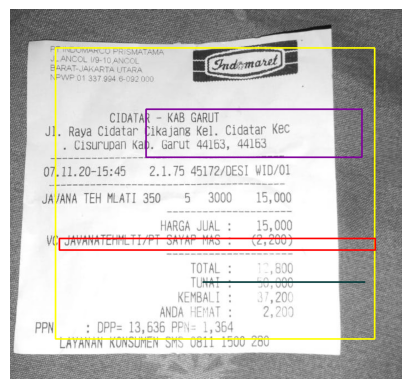

<tf.Tensor: shape=(4,), dtype=int32, numpy=array([ 82,  70, 579, 528])>

In [73]:
obj_detect_all(r'C:\Users\dzaki\Downloads\test_indomaret3.jpg')

In [82]:
model.save(r'.\Saved Models\model.keras')
model_1.save(r'.\Saved Models\model_1.keras')
model_2.save(r'.\Saved Models\model_2.keras')
model_3.save(r'.\Saved Models\model_3.keras')